In [24]:
import os
import shutil
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import cv2 as cv

import rasterio
from rasterio.plot import reshape_as_image
from rasterio.features import rasterize
from shapely.ops import cascaded_union
from shapely.geometry import Polygon

import warnings
warnings.filterwarnings('ignore')


jp2_path = 'T36UXV_20200406T083559_TCI_10m.jp2'

# Data Analysis

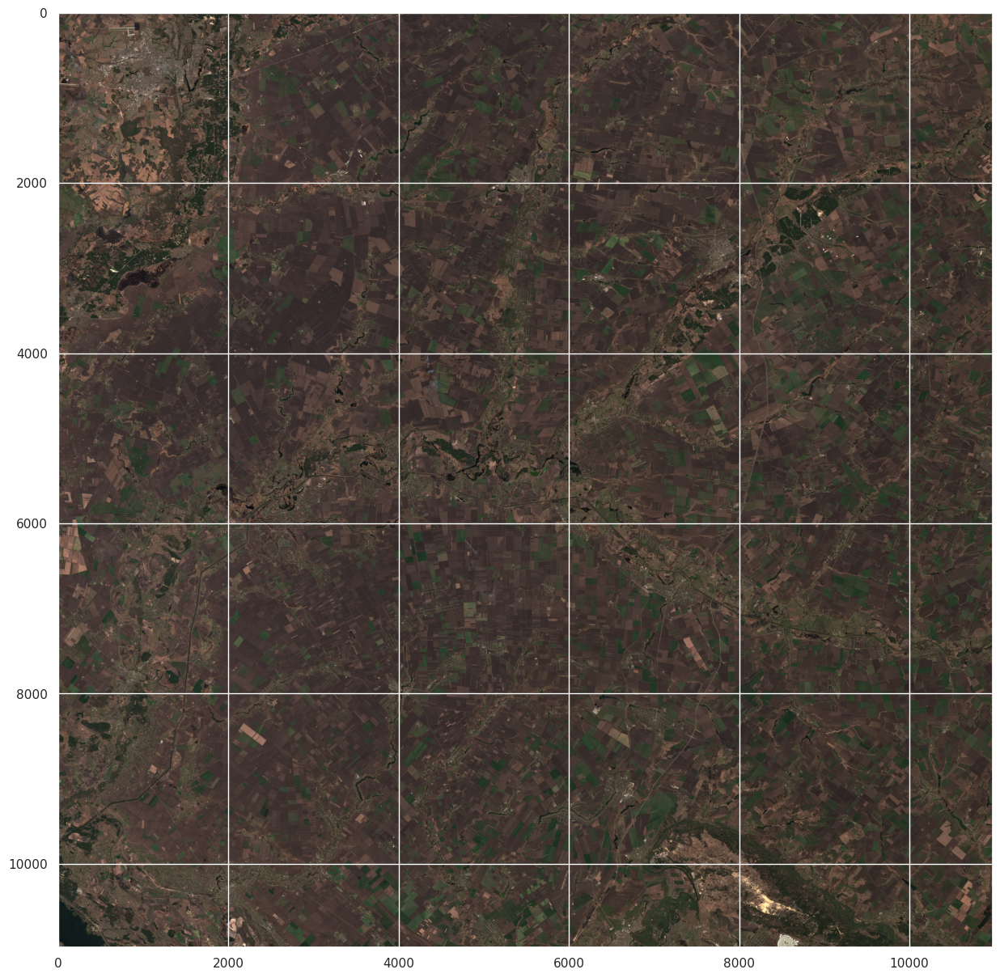

In [25]:
with rasterio.open(jp2_path, 'r', driver='JP2OpenJPEG') as src:
    raster_img = src.read()
    raster_meta = src.meta

plt.figure(figsize=(15,15))
# Transform (C,H,W) -> (H,W,C)
img = reshape_as_image(raster_img)
plt.imshow(img)

We can see that the data we received is just one giant picture. This data will clearly not be enough to train the own model, so we will use pretrained one, which will be faster also.

In [27]:
labels = gpd.read_file("masks/Masks_T36UXV_20190427.shp").drop(['id', 'Data', 'Comments'], axis=1)
labels

,Code,Descriptio,Image,geometry
0,2.0,branch of tree,T36UXV_20190427T083601,"POLYGON ((35.62916 49.60293, 35.63015 49.60163..."
1,1.0,color+ feathers,T36UXV_20190427T083601,"POLYGON ((35.65070 49.60254, 35.65248 49.60301..."
2,2.0,brahch of tree,T36UXV_20190427T083601,"POLYGON ((35.63023 49.60826, 35.62960 49.60920..."
3,1.0,color+ feathers,T36UXV_20190427T083601,"POLYGON ((35.62033 49.60905, 35.62064 49.60968..."
4,1.0,color+ feathers,T36UXV_20190427T083601,"POLYGON ((35.60455 49.61078, 35.60597 49.61228..."
...,...,...,...,...
931,1.0,color+ structure,T36UXV_20190427T083601,"POLYGON ((35.60033 49.04547, 35.60011 49.04496..."
932,1.0,color+ structure,T36UXV_20190427T083601,"POLYGON ((35.59042 49.04165, 35.59127 49.04155..."
933,1.0,color+ structure,T36UXV_20190427T083601,"POLYGON ((35.60754 49.05593, 35.60796 49.05600..."
934,1.0,color+ structure,T36UXV_20190427T083601,"POLYGON ((35.52378 48.76951, 35.52332 48.76918..."


Behind the scenes, I also checked the contents of other files from the mask folder (but not all of them could be opened). So it looks like they all contain the same data set so far. So, as labels, we have the coordinates of the polygons that mark the soil that has undergone erosion on our giant picture. I dropped id, Data, Comment, because there are completely missing data.

In [28]:
display(labels.Code.value_counts())
print('#' * 25)
labels.Descriptio.value_counts()

1.0    239
2.0     74
5.0     13
3.0     10
9.0      3
4.0      1
Name: Code, dtype: int64

#########################


color+ structure            212
branch of tree               73
color+ feathers              24
color (opodz)                11
small branch                  4
???                           3
color + feathers              2
branch + color+ feathers      2
brahch of tree                1
color+ feathers + branch      1
color (map NGO)               1
small tree                    1
Name: Descriptio, dtype: int64

<Axes: >

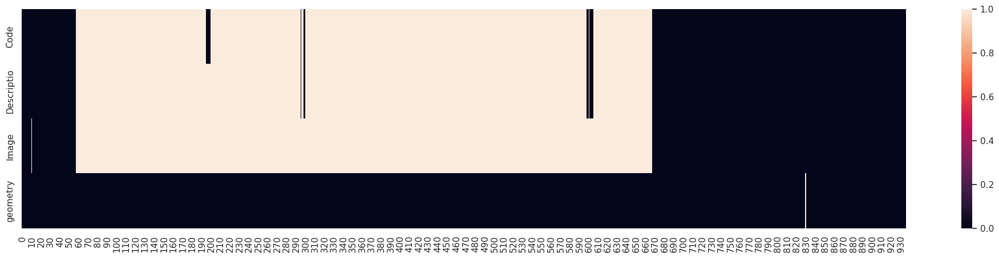

In [16]:
plt.figure(figsize=(25,5))
sns.heatmap(labels.isna().T)

Also, in addition to polygons, our data contains information about the Code of this polygon, which is still difficult to interpret, but it may help in the future to understand model errors. We also have a description field, which most likely describes the terrain of the landfill. Much of this data is lost. One missing value in polygon (geometry).

In [8]:
labels.geometry[0].exterior.coords.xy

(array('d', [35.62916346617293, 35.63014960535702, 35.631175190108465, 35.631214635675825, 35.630031268654925, 35.62888734720139, 35.62813788142149, 35.62774342574785, 35.62813788142149, 35.62916346617293]),
 array('d', [49.602931546762534, 49.60162984303954, 49.60080148612491, 49.59981534694083, 49.6001703570471, 49.60111705066382, 49.60214263541526, 49.60289210119517, 49.60312877459935, 49.602931546762534]))

In [29]:
# let's remove row without geometry
labels = labels[labels.geometry.notnull()]

# assigning crs
# sources: https://www.youtube.com/watch?v=xJyJlKbZFlc, http://projfinder.com/
labels.crs = {'init' :'epsg:4258'}

#transforming polygons to the raster crs
labels = labels.to_crs({'init' : raster_meta['crs']['init']})
labels

,Code,Descriptio,Image,geometry
0,2.0,branch of tree,T36UXV_20190427T083601,"POLYGON ((689961.152 5497804.667, 690037.456 5..."
1,1.0,color+ feathers,T36UXV_20190427T083601,"POLYGON ((691518.623 5497815.456, 691645.003 5..."
2,2.0,brahch of tree,T36UXV_20190427T083601,"POLYGON ((690017.383 5498399.293, 689968.112 5..."
3,1.0,color+ feathers,T36UXV_20190427T083601,"POLYGON ((689299.133 5498462.011, 689319.252 5..."
4,1.0,color+ feathers,T36UXV_20190427T083601,"POLYGON ((688152.716 5498615.331, 688249.512 5..."
...,...,...,...,...
931,1.0,color+ structure,T36UXV_20190427T083601,"POLYGON ((690012.338 5435767.601, 689998.527 5..."
932,1.0,color+ structure,T36UXV_20190427T083601,"POLYGON ((689303.051 5435318.547, 689365.361 5..."
933,1.0,color+ structure,T36UXV_20190427T083601,"POLYGON ((690499.318 5436948.995, 690529.292 5..."
934,1.0,color+ structure,T36UXV_20190427T083601,"POLYGON ((685438.102 5404906.207, 685405.307 5..."


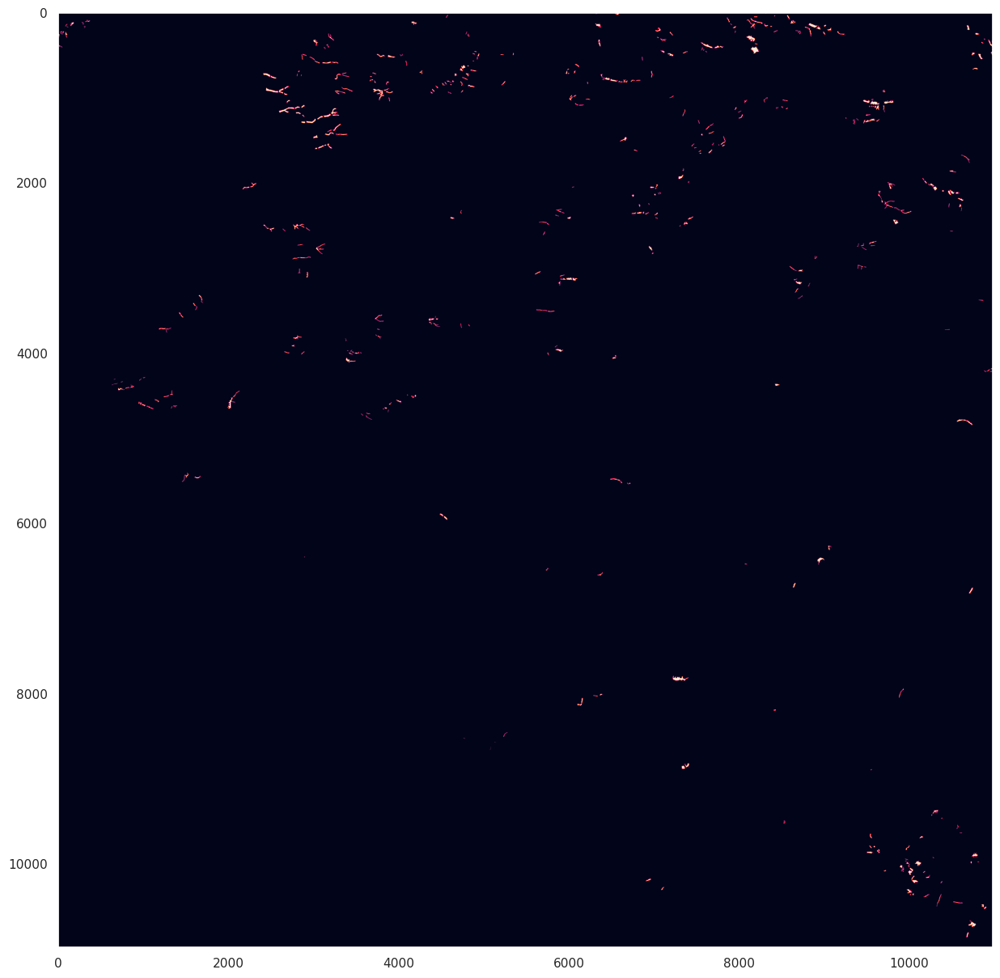

In [30]:
def create_mask(src, labels):
    def poly_from_utm(polygon, transform):
        poly_pts = []
        
        # make a polygon from multipolygon
        poly = cascaded_union(polygon)
        for i in np.array(poly.exterior.coords):
            
            # transfrom polygon to image crs, using raster meta
            poly_pts.append(~transform * tuple(i))
            
        # make a shapely Polygon object
        new_poly = Polygon(poly_pts)
        return new_poly


    # creating binary mask for field/not_filed segmentation.
    poly_shp = []
    im_size = (src.meta['height'], src.meta['width'])
    for num, row in labels.iterrows():
        if row['geometry'].geom_type == 'Polygon':
            poly = poly_from_utm(row['geometry'], src.meta['transform'])
            poly_shp.append(poly)

    # rasterize works with polygons that are in image coordinate system
    mask = rasterize(shapes=poly_shp,
                    out_shape=im_size)
    
    return mask


mask = create_mask(src, labels)
# plotting the mask
plt.figure(figsize=(15,15))
plt.imshow(mask)
plt.grid(False)

Wonderful! We managed to reproduce and glue all our masks together, so now we have identical images and a mask to segment it. Let's start constructing datasets for our future model, since there is not a lot of data, we can save them on the local machine. The size of our giant image is 10980x10980, which will be perfectly divided into 45 pieces of 244 in each direction. With this division, we will have 2025 objects for training, from the bottom 15 percent will be allocated to the validation dataset and 15 to the test dataset.

In [32]:
def crop_and_save(img, mask, crop_size=244, save_path='data', with_info_only=True, random_state=13):
    np.random.seed(random_state)
    
    shutil.rmtree(save_path, ignore_errors=True)
    [os.makedirs(os.path.join(save_path, folder, subfolder)) for \
        folder in ['train', 'valid', 'test'] for subfolder in ['images', 'masks']]
    
    for j in np.arange(img.shape[1] / crop_size, dtype=np.int64):
        for i in np.arange(img.shape[0] / crop_size, dtype=np.int64):
            crop_img = img[i*crop_size: i*crop_size + crop_size, j*crop_size: j*crop_size + crop_size]
            crop_mask = mask[i*crop_size: i*crop_size + crop_size, j*crop_size: j*crop_size + crop_size]
            
            # save only crops with mask content if with_info_only
            if crop_mask.sum() == 0 and with_info_only:
                continue
            
            dataset = 'train'
            # 70 % to appear in train
            if np.random.choice([0, 1], p=[0.7, 0.3]):
                dataset = 'valid'
                # 15% to appear in test or valid
                if np.random.choice([0, 1]):
                    dataset = 'test'
            
            img_path = os.path.join(save_path, dataset, 'images', f'crop_{i}_{j}.jpg')
            mask_path = os.path.join(save_path, dataset, 'masks', f'crop_{i}_{j}.jpg')
            cv.imwrite(img_path, crop_img)
            # mask has only 0 and 1 values
            crop_mask = (crop_mask != 0).astype(np.float64)
            cv.imwrite(mask_path, crop_mask)

    
crop_and_save(img, mask)

print(f'Train size: {len(os.listdir("data/train/images"))}')
print(f'Valid size: {len(os.listdir("data/valid/images"))}')
print(f'Test size: {len(os.listdir("data/test/images"))}')

Train size: 198
Valid size: 37
Test size: 39


We now have a perfectly distributed dataset ready to feed into the model, but first let's take a closer look at our data and visualize a few patches and their corresponding masks. You can investigate different images by changing <b>random_state</b>.

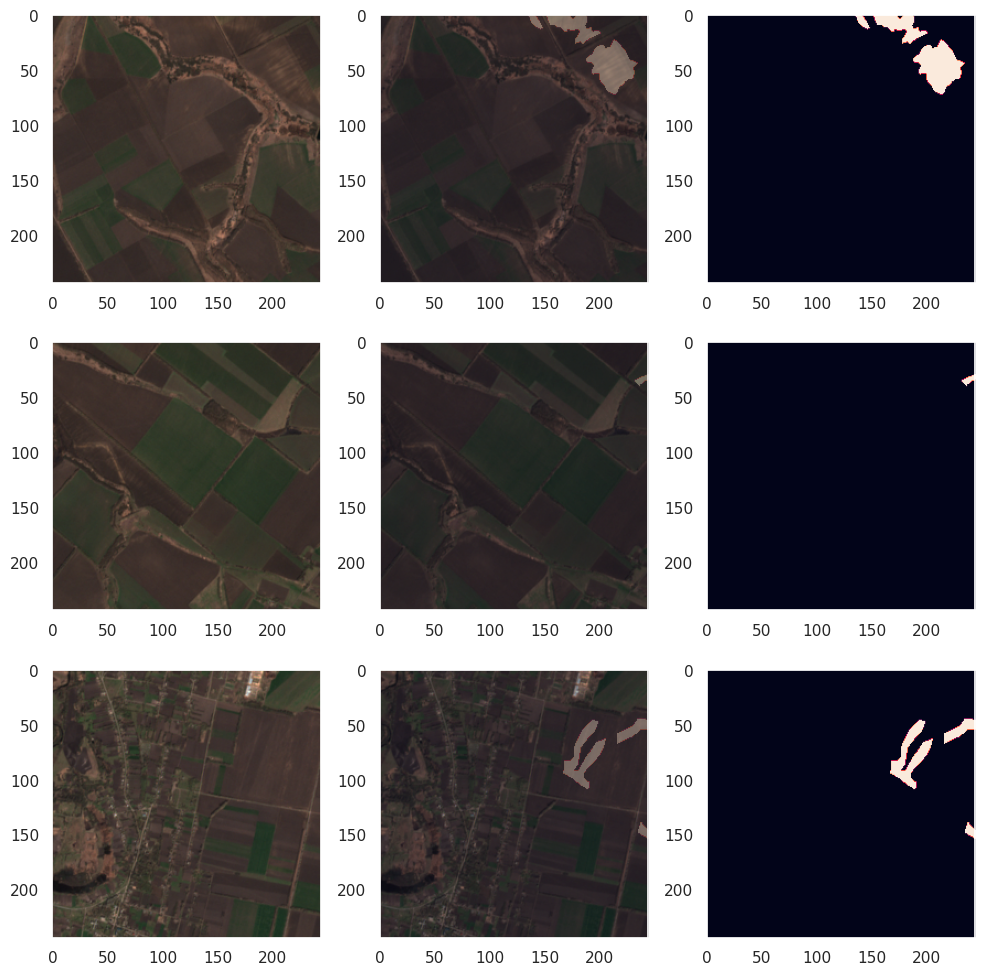

In [51]:
def plot_grid(img, mask, nrows=3, crop_size=244, figsize=(10,10), random_state=13):
    fig, ax = plt.subplots(nrows, 3, figsize=figsize)
    np.random.seed(13)
    
    while nrows:
        x = np.random.randint(img.shape[0] - crop_size)
        y = np.random.randint(img.shape[1] - crop_size)
        crop_img = img[x: x + crop_size, y: y + crop_size]
        crop_mask = mask[x: x + crop_size, y: y + crop_size]
        
        if crop_mask.sum() == 0:
            continue
        nrows -= 1
        
        ax[nrows, 0].imshow(crop_img)
        ax[nrows, 1].imshow(crop_img)
        ax[nrows, 1].imshow(crop_mask*255, alpha=0.3)
        ax[nrows, 2].imshow(crop_mask*255)
        ax[nrows, 0].grid(False)
        ax[nrows, 1].grid(False)
        ax[nrows, 2].grid(False)       
        
    plt.tight_layout()
    plt.show()

    
plot_grid(img, mask)

Now we have the ability to quickly look at examples of objects that our model will study. Let's return to additional data in these labels. This time we will try to build a mask for individual Codes or Decriptions and try to understand if they have any significant context.

In [83]:
labels_code1 = labels[labels.Code == 1.0]
labels_code2 = labels[labels.Code == 2.0]
labels_des_color = labels[labels.Descriptio == 'color+ structure']
labels_des_branch = labels[labels.Descriptio == 'branch of tree']

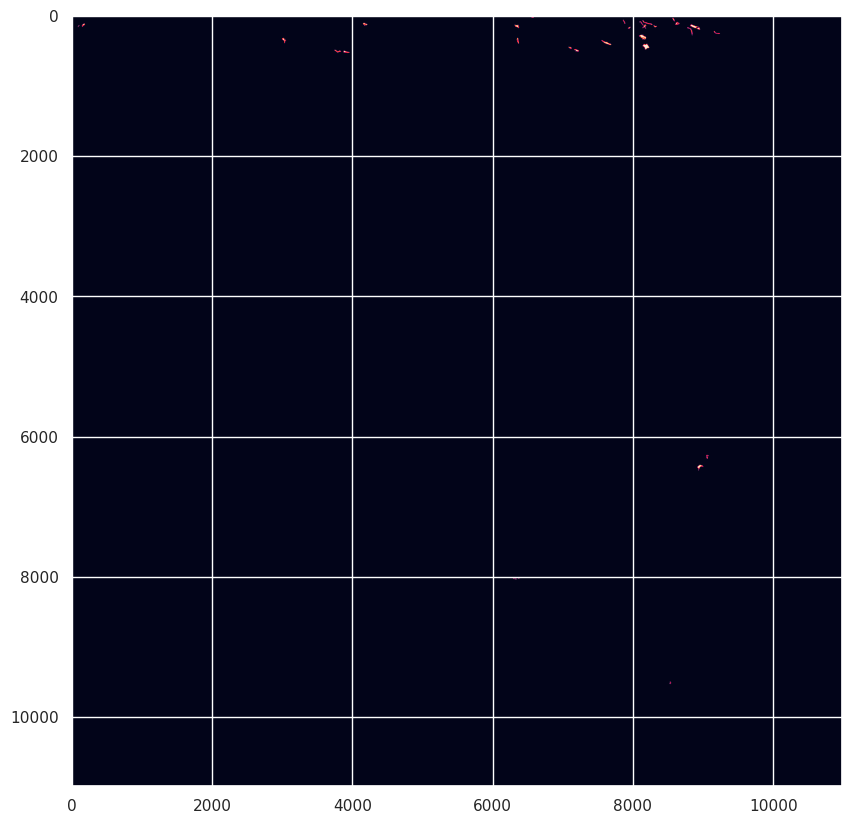

In [84]:
plt.imshow(create_mask(src, labels_code1))

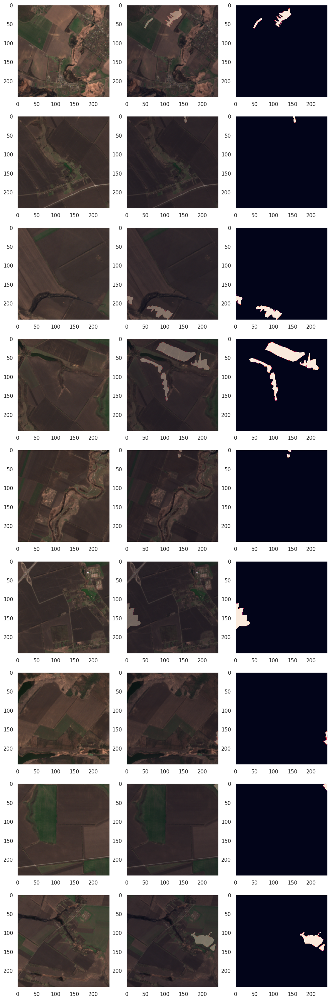

In [92]:
plot_grid(img, create_mask(src, labels_code1), nrows=9, figsize=(10, 30))

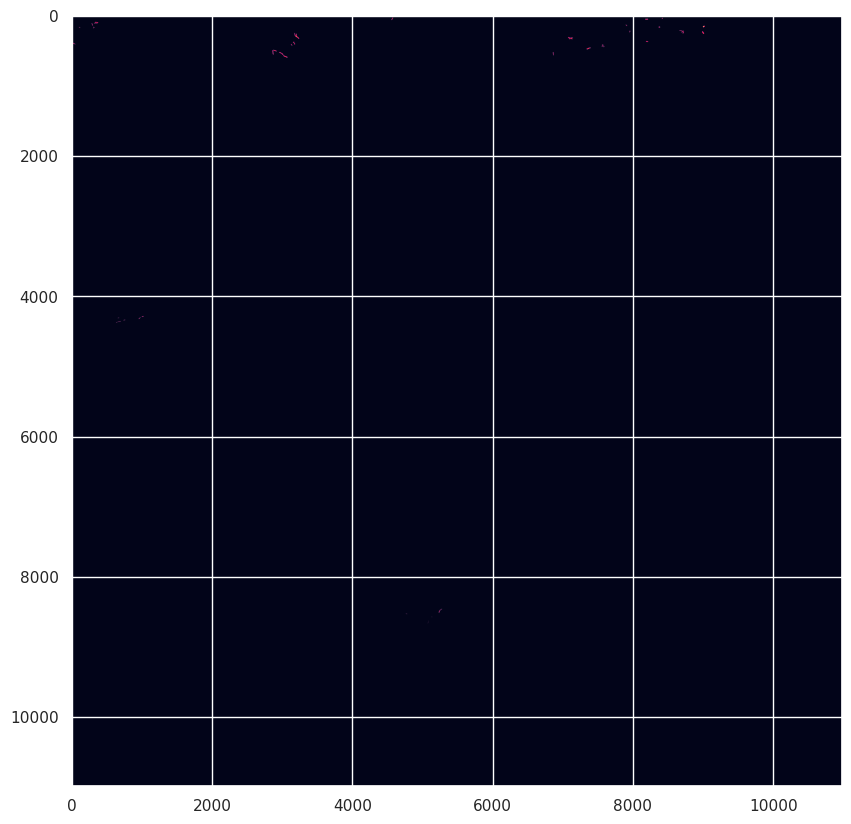

In [86]:
plt.figure(figsize=(10,10))
plt.imshow(create_mask(src, labels_code2))

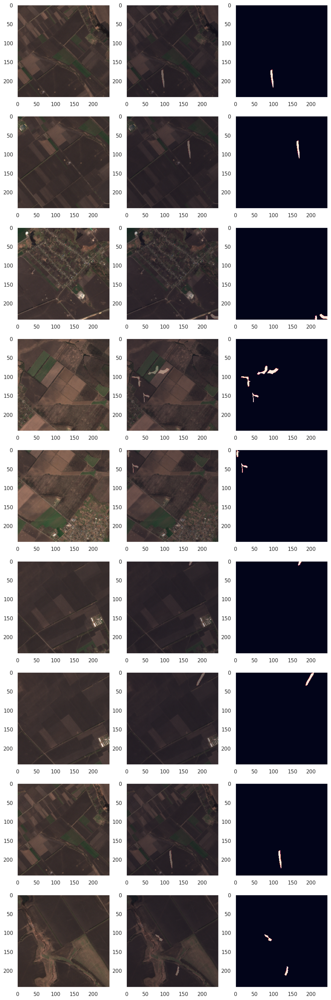

In [87]:
plot_grid(img, create_mask(src, labels_code2), nrows=9, figsize=(10, 30))

Among the Code, I only examine 1.0 and 2.0, because they occur most frequently. The same among Destriptio - color + structure and branch of tree. Behind the scene, I ran several dozen examples of the Code 1.0 and 2.0 class, but I didn't notice any significant differences, except that, in my opinion, the objects in Code 1.0 are larger in shape and not as elongated.

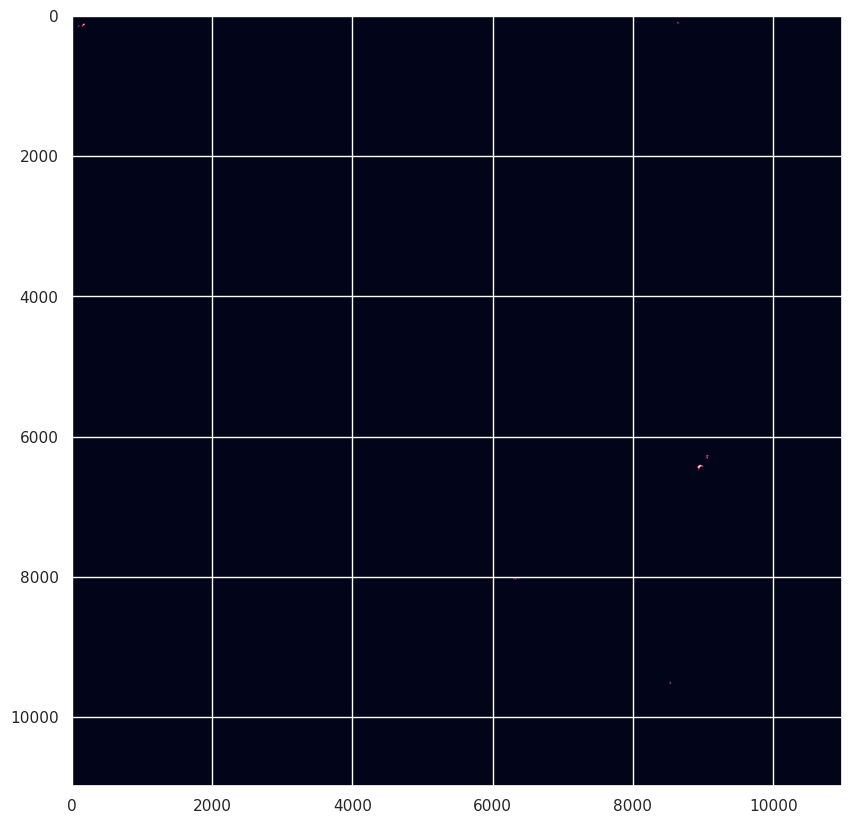

In [88]:
plt.figure(figsize=(10,10))
plt.imshow(create_mask(src, labels_des_color))

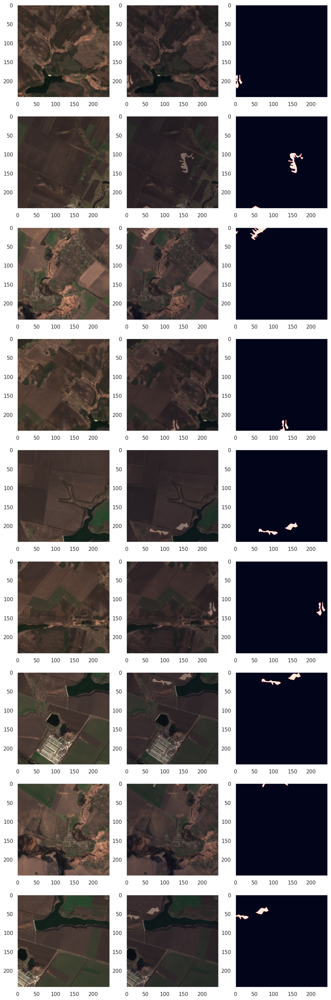

In [94]:
plot_grid(img, create_mask(src, labels_des_color), nrows=9, figsize=(10, 30))

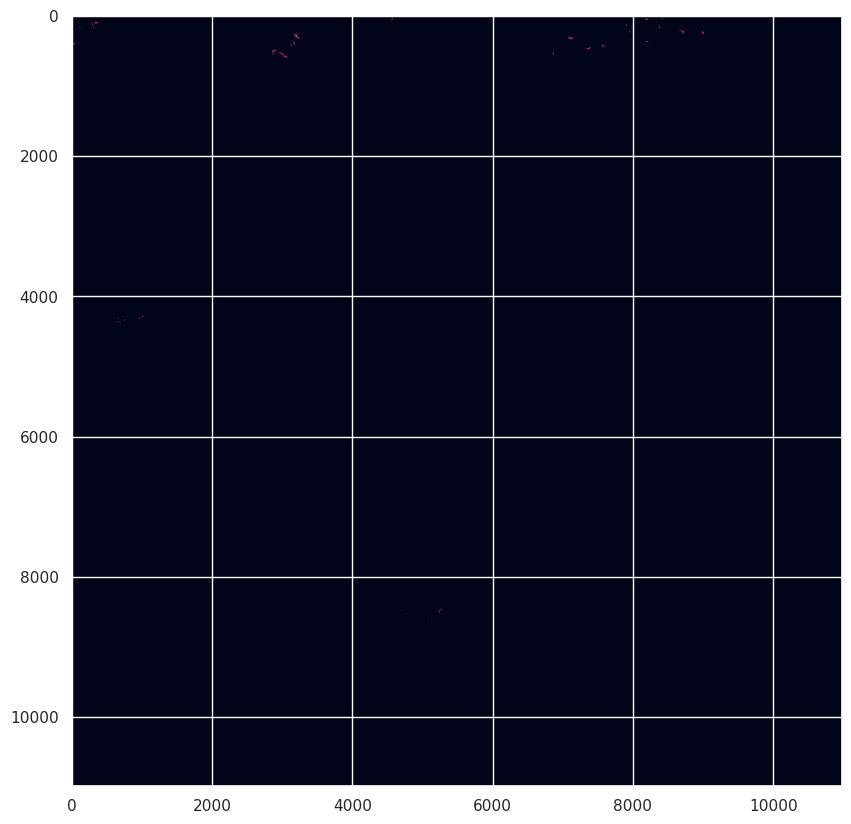

In [90]:
plt.figure(figsize=(10,10))
plt.imshow(create_mask(src, labels_des_branch))

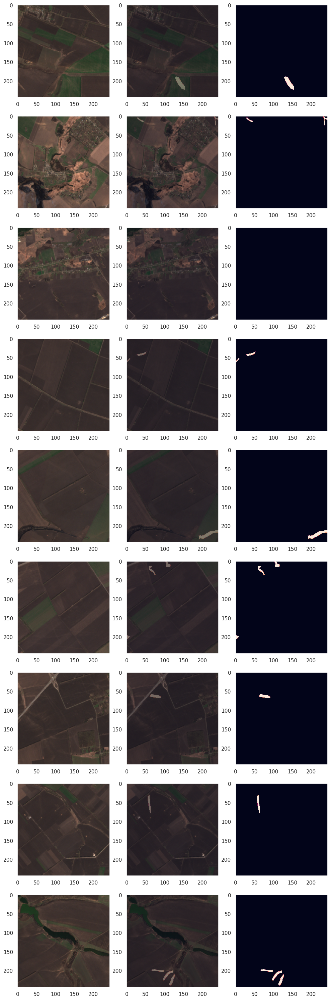

In [95]:
plot_grid(img, create_mask(src, labels_des_branch), nrows=9, figsize=(10, 30))

Unfortunately, I did not find any obvious patterns for myself. We can start modeling
# Modeling

In [8]:
# TODO use data augumentation to increase size of train dataset
# TODO try Unet and DeepLabv3, compare them on default
# TODO try Binary cross entropy loss
# TODO try to save only images with active mask to dataset
# TODO compare pad vs resizing img
# TODO try AutoAugumentation (provide better perfomance)
# TODO try augumentation default by backbone
# TODO add Lighting DataModule

# TODO try to froze all layers exept last if possible

In [2]:
%load_ext autoreload
%autoreload 2
from settings.config import Config
from utils import SoilErosionDataset, set_seed, get_transforms, get_shuffle

import torch
from torch.utils.data import DataLoader
import segmentation_models_pytorch as smp
import pytorch_lightning as pl

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

We will create appropriate datasets, we will not apply augmentation now, but we will leave room here for experiments in the future.

In [3]:
set_seed(Config.seed)

datasets = {name: SoilErosionDataset(name, get_transforms(name)) for name in ['train', 'valid', 'test']}
dataloaders = {name: DataLoader(datasets[name], batch_size=Config.batch_size, 
                                shuffle=get_shuffle(name), num_workers=Config.num_workers) 
               for name in ['train', 'valid', 'test']}

In [55]:
unet = smp.Unet(encoder_name='efficientnet-b5', encoder_depth=5, encoder_weights='imagenet', 
                 decoder_channels=[512, 256, 128, 64, 32], decoder_use_batchnorm=True, 
                 classes=Config.num_classes, activation=None)

In [56]:
class SoilErosionSegmentation(pl.LightningModule):
    def __init__(self, model, criterion, learning_rate=1e-3):
        super().__init__()
        self.model = model
        self.criterion = criterion
        self.learning_rate = learning_rate
        self.save_hyperparameters(ignore=['model', 'criterion'])
        
    def training_step(self, batch, batch_idx):
        loss, outputs = self._common_step(batch, batch_idx)
        self.log_dict({'train_loss': loss})
        return loss
    
    def validation_step(self, batch, batch_idx):
        loss, outputs = self._common_step(batch, batch_idx)
        self.log_dict({'val_loss': loss})
        return loss
    
    def test_step(self, batch, batch_idx):
        loss, outputs = self._common_step(batch, batch_idx)
        self.log_dict({'test_loss': loss})
        return loss
    
    def predict_step(self, batch, batch_idx, dataloader_idx=0):
        loss, outputs = self._common_step(batch, batch_idx)
        return outputs
    
    def _common_step(self, batch, batch_idx):
        imgs, masks = batch
        outputs = self.model(imgs)
        loss = self.criterion(masks, outputs)
        return loss, outputs
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer

In [57]:
model = SoilErosionSegmentation(unet, torch.nn.BCEWithLogitsLoss())

checkpoint_callback = pl.callbacks.ModelCheckpoint(dirpath=Config.model_path, save_top_k=1,
                                                   verbose=False, monitor='val_loss',mode='min')

trainer = pl.Trainer(accelerator=Config.accelerator, min_epochs=Config.min_epochs, max_epochs=Config.max_epochs, 
                     default_root_dir=Config.logs_path, callbacks=checkpoint_callback)
trainer.fit(model=model, train_dataloaders=dataloaders['train'], val_dataloaders=dataloaders['valid'])
#trainer.validate(model=modelval_dataloaders=dataloaders['valid'])
#trainer.test(model=modelval_dataloaders=dataloaders['test'])
#trainer.tune(...)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: ./lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params
------------------------------------------------
0 | model     | Unet              | 36.4 M
1 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
36.4 M    Trainable params
0         Non-trainable params
36.4 M    Total params
145.784   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.


In [21]:
%reload_ext tensorboard
%tensorboard --logdir=logs/ --port=3636

In [73]:
outs = trainer.predict(model, dataloaders['valid'])

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 50it [00:00, ?it/s]

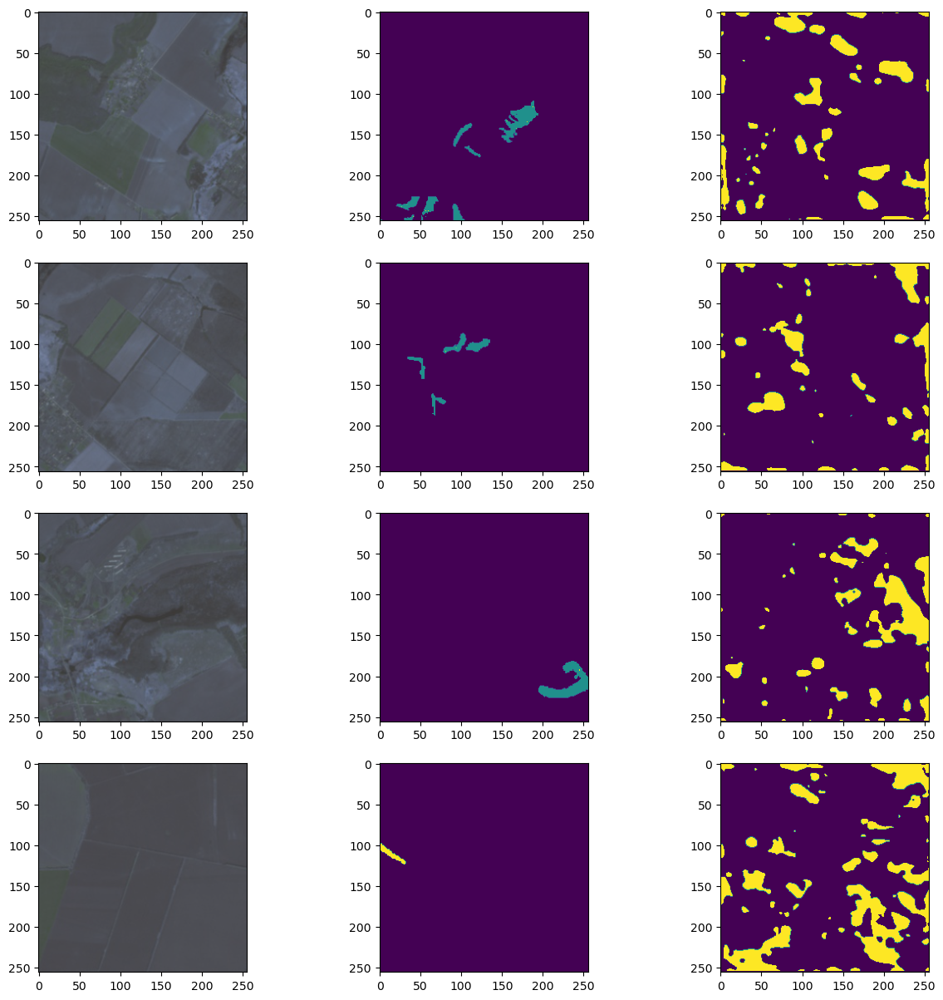

In [77]:
plt.figure(figsize=(15,15))
data = next(iter(dataloaders['valid']))
for i in range(data[1].shape[0]):
    ax1 = plt.subplot(data[1].shape[0], 3, 3*i + 1)
    ax2 = plt.subplot(data[1].shape[0], 3, 3*i + 2)
    ax3 = plt.subplot(data[1].shape[0], 3, 3*i + 3)
    
    ax1.imshow(data[0][i].numpy().transpose(1,2,0)*0.26 + 0.46)
    ax2.imshow(data[1][i][0])
    ax3.imshow((outs[1] > outs[1].mean()).float()[i][0])